<a href="https://colab.research.google.com/github/Dezmoine/Cutie/blob/main/old_cutie.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!nvidia-smi

import torch

if torch.cuda.is_available():
  print('Using GPU')
  device = 'cuda'
else:
  print('CUDA not available. Please connect to a GPU instance if possible.')
  device = 'cpu'

Tue Apr 22 18:16:17 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   44C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# Get our code and install prerequisites

In [ ]:
!git clone https://github.com/hkchengrex/Cutie.git
%cd Cutie
!pip install -e .

Cloning into 'Cutie'...
remote: Enumerating objects: 609, done.
remote: Counting objects: 100% (235/235), done.
remote: Compressing objects: 100% (102/102), done.
remote: Total 609 (delta 170), reused 160 (delta 132), pack-reused 374 (from 1)
Receiving objects: 100% (609/609), 2.84 MiB | 6.33 MiB/s, done.
Resolving deltas: 100% (285/285), done.
/content/Cutie
Obtaining file:///content/Cutie
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Installing backend dependencies ... done
  Preparing editable metadata (pyproject.toml) ... done
  Cloning https://github.com/cheind/py-thin-plate-spline to /tmp/pip-install-ivdcc9v0/thinplate_15ded58af2094b4da4308a5b5ab98db6
  Running command git clone --filter=blob:none --quiet https://github.com/cheind/py-thin-plate-spline /tmp/pip-install-ivdcc9v0/thinplate_15ded58af2094b4da4308a5b5ab98db6
  Resolved https://github.com/cheind/py-thin-plate-spli

# Then restart the runtime.

# Download the pretrained model

In [ ]:
%cd /content/Cutie
!python cutie/utils/download_models.py

[Errno 2] No such file or directory: '/content/Cutie'
/content
python3: can't open file '/content/cutie/utils/download_models.py': [Errno 2] No such file or directory


# Basic setup

In [ ]:
%cd /content/Cutie/

from os import path
import logging
from omegaconf import DictConfig
import hydra
from hydra.core.hydra_config import HydraConfig
from omegaconf import open_dict
from hydra import compose, initialize

import torch
from torch.utils.data import DataLoader
import numpy as np
from PIL import Image

from cutie.inference.data.vos_test_dataset import VOSTestDataset
from cutie.inference.data.burst_test_dataset import BURSTTestDataset
from cutie.model.cutie import CUTIE
from cutie.inference.inference_core import InferenceCore
from cutie.inference.utils.results_utils import ResultSaver, make_zip
from cutie.inference.utils.burst_utils import BURSTResultHandler
from cutie.inference.utils.args_utils import get_dataset_cfg

from tqdm import tqdm


with torch.inference_mode():
  initialize(version_base='1.3.2', config_path="cutie/config", job_name="eval_config")
  cfg = compose(config_name="eval_config")

  with open_dict(cfg):
    cfg['weights'] = './weights/cutie-base-mega.pth'

  data_cfg = get_dataset_cfg(cfg)

  # Load the network weights
  cutie = CUTIE(cfg).cuda().eval()
  model_weights = torch.load(cfg.weights)
  cutie.load_weights(model_weights)

/content/Cutie


Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 168MB/s]
Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 179MB/s]


# Load some data

In [ ]:
!wget -O video.mp4 https://user-images.githubusercontent.com/7107196/177661140-f690156b-1775-4cd7-acd7-1738a5c92f30.mp4
!wget -O first_frame.png https://github.com/hkchengrex/Cutie/releases/download/v1.0/3ueaiBA.png

video_name = 'video.mp4'
mask_name = 'first_frame.png'

--2025-04-14 11:57:14--  https://user-images.githubusercontent.com/7107196/177661140-f690156b-1775-4cd7-acd7-1738a5c92f30.mp4
Resolving user-images.githubusercontent.com (user-images.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to user-images.githubusercontent.com (user-images.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 5155611 (4.9M) [video/mp4]
Saving to: ‘video.mp4’

video.mp4           100%[===================>]   4.92M  --.-KB/s    in 0.05s   

2025-04-14 11:57:15 (107 MB/s) - ‘video.mp4’ saved [5155611/5155611]

--2025-04-14 11:57:15--  https://github.com/hkchengrex/Cutie/releases/download/v1.0/3ueaiBA.png
Resolving github.com (github.com)... 140.82.114.4
Connecting to github.com (github.com)|140.82.114.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://objects.githubusercontent.com/github-production-release-asset-2e65be/7073451

# Preview the video and first-frame annotation

In [ ]:
from IPython.display import HTML
from base64 import b64encode
data_url = "data:video/mp4;base64," + b64encode(open(video_name, 'rb').read()).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

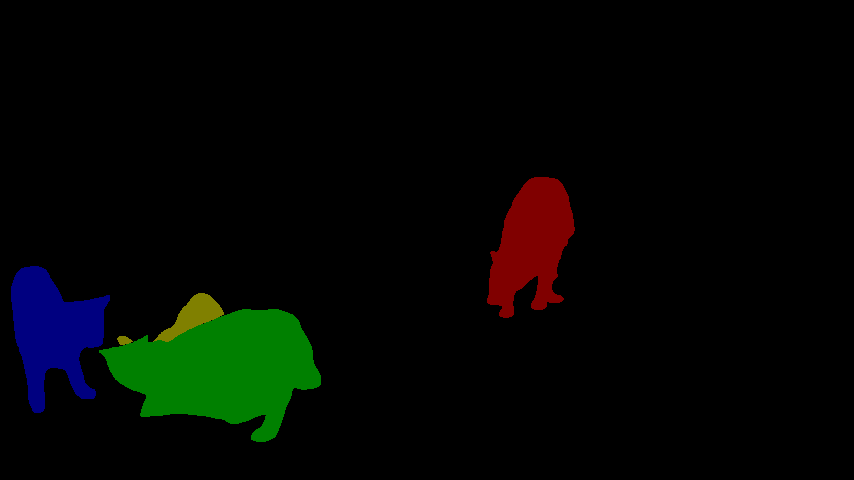

In [ ]:
import IPython.display
IPython.display.Image('first_frame.png', width=400)

## Convert the mask to a numpy array

In [ ]:
mask = np.array(Image.open(mask_name))
print(np.unique(mask))
num_objects = len(np.unique(mask)) - 1

[0 1 2 3 4]


# Propagte frame-by-frame

<ipython-input-7-98496d988e3d>:17: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=True):
/content/Cutie/cutie/utils/tensor_utils.py:48: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):
/content/Cutie/cutie/model/modules.py:79: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):
/content/Cutie/cutie/model/transformer/object_summarizer.py:78: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):


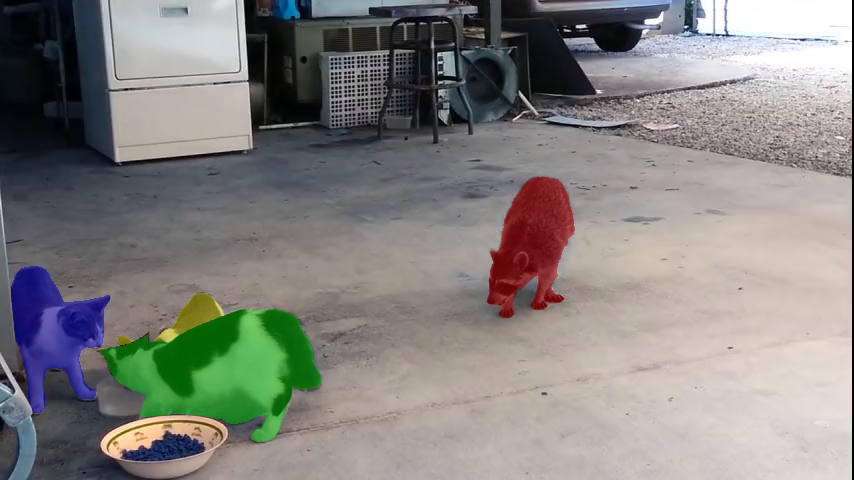

/content/Cutie/cutie/model/big_modules.py:289: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):
/content/Cutie/cutie/model/modules.py:62: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=False):


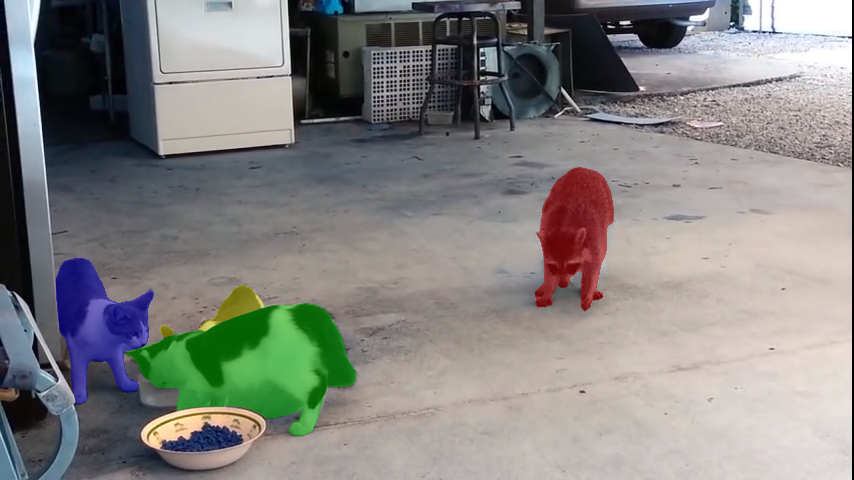

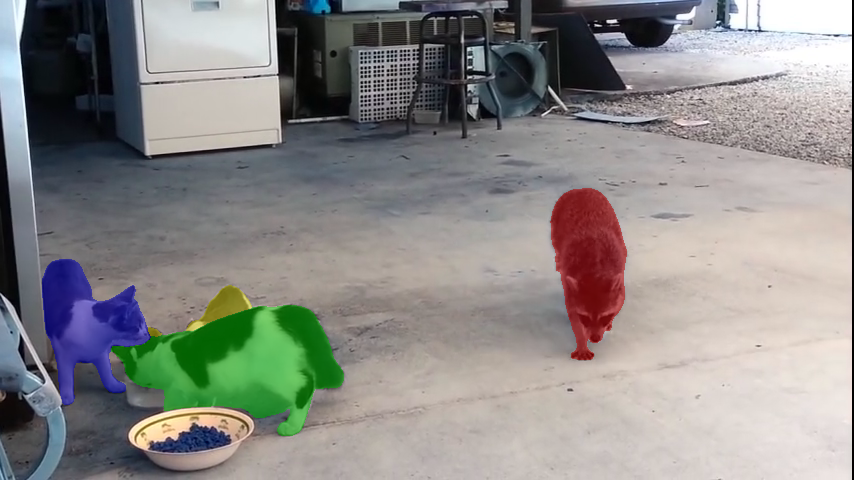

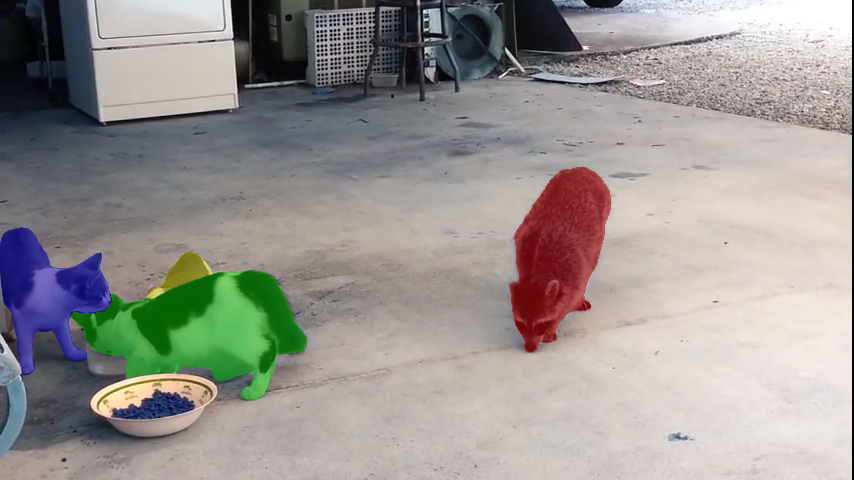

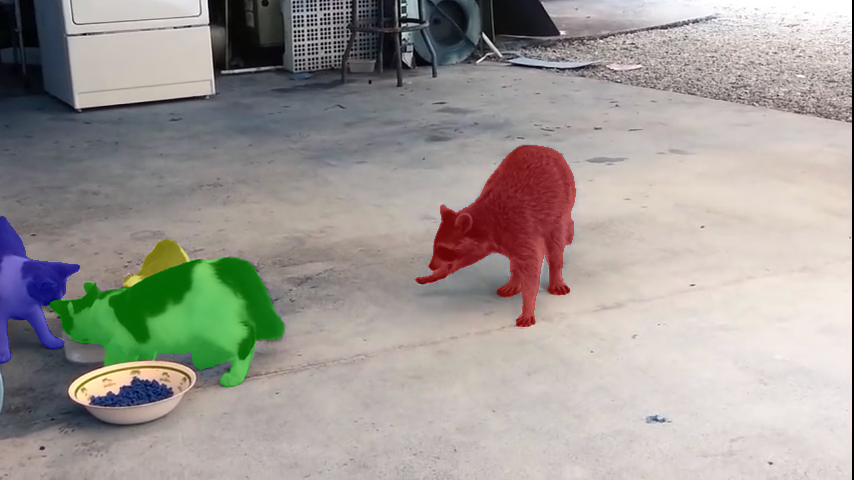

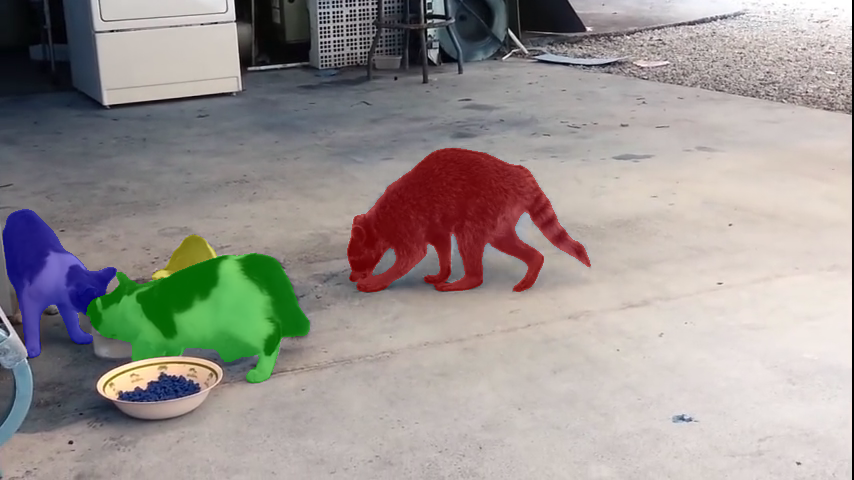

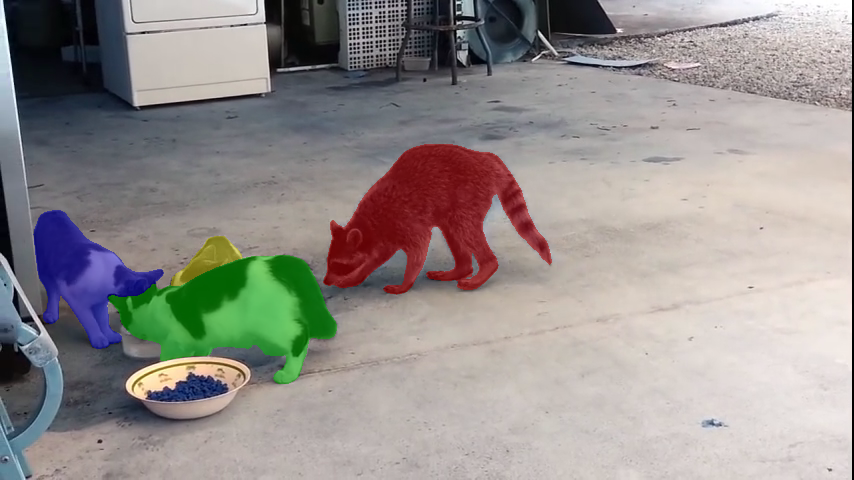

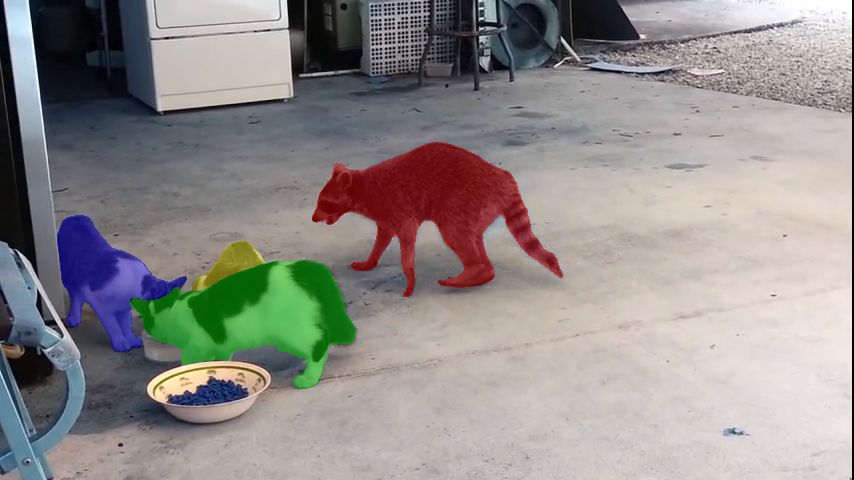

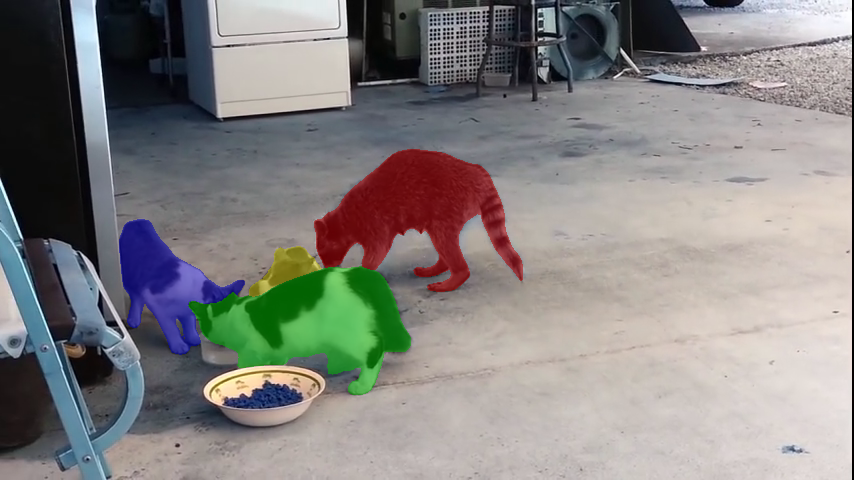

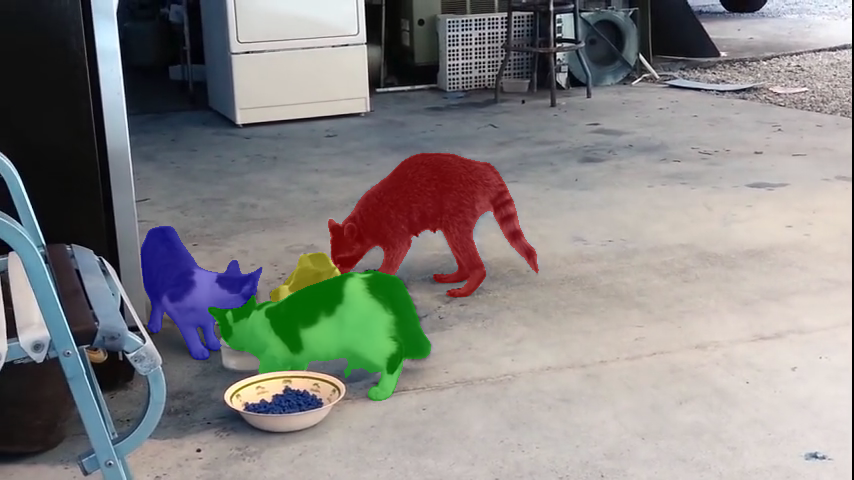

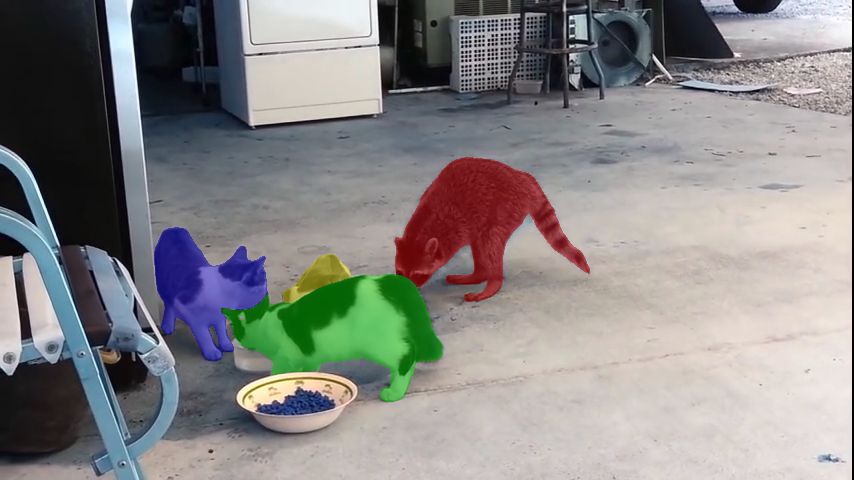

In [ ]:
import cv2
from gui.interactive_utils import image_to_torch, torch_prob_to_numpy_mask, index_numpy_to_one_hot_torch, overlay_davis

device = 'cuda'
torch.cuda.empty_cache()

processor = InferenceCore(cutie, cfg=cfg)
cap = cv2.VideoCapture(video_name)

# You can change these two numbers
frames_to_propagate = 200
visualize_every = 20

current_frame_index = 0

with torch.inference_mode():
  with torch.cuda.amp.autocast(enabled=True):
    while (cap.isOpened()):
      # load frame-by-frame
      _, frame = cap.read()
      if frame is None or current_frame_index > frames_to_propagate:
        break

      # convert numpy array to pytorch tensor format
      frame_torch = image_to_torch(frame, device=device)
      if current_frame_index == 0:
        # initialize with the mask
        mask_torch = index_numpy_to_one_hot_torch(mask, num_objects+1).to(device)
        # the background mask is not fed into the model
        prediction = processor.step(frame_torch, mask_torch[1:], idx_mask=False)
      else:
        # propagate only
        prediction = processor.step(frame_torch)

      # argmax, convert to numpy
      prediction = torch_prob_to_numpy_mask(prediction)

      if current_frame_index % visualize_every == 0:
        visualization = overlay_davis(frame, prediction)
        display(Image.fromarray(visualization))

      current_frame_index += 1

In [ ]:
%ls /content/Cutie/

cutie/           interactive_demo.py                scripting_demo.py
docs/            LICENSE                            scripts/
examples/        pyproject.toml                     video.mp4
first_frame.png  README.md                          weights/
gui/             scripting_demo_add_del_objects.py


In [ ]:
%ls /content/Cutie/weights/

coco_lvis_h18_itermask.pth  cutie-base-mega.pth


# Manual Installation

In [ ]:
%cd /content/drive/MyDrive/Cutie
!pip install -e .

/content/drive/MyDrive/Cutie
Obtaining file:///content/drive/MyDrive/Cutie
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Installing backend dependencies ... done
  Preparing editable metadata (pyproject.toml) ... done
  Cloning https://github.com/cheind/py-thin-plate-spline to /tmp/pip-install-6sqnu1va/thinplate_8bf28326d0f349f99d08cb97feaa7d20
  Running command git clone --filter=blob:none --quiet https://github.com/cheind/py-thin-plate-spline /tmp/pip-install-6sqnu1va/thinplate_8bf28326d0f349f99d08cb97feaa7d20
  Resolved https://github.com/cheind/py-thin-plate-spline to commit f6995795397118b7d0ac01aecd3f39ffbfad9dee
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 653.6/653.6 kB 9.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 12

In [ ]:
%cd /content/drive/MyDrive/Cutie
!python cutie/utils/download_models.py

/content/drive/MyDrive/Cutie


In [ ]:
%cd /content/drive/MyDrive/Cutie
!python interactive_demo.py --video ./examples/example.mp4 --num_objects 1

/content/drive/MyDrive/Cutie
Using device: cuda
qt.qpa.plugin: From 6.5.0, xcb-cursor0 or libxcb-cursor0 is needed to load the Qt xcb platform plugin.
qt.qpa.plugin: Could not load the Qt platform plugin "xcb" in "" even though it was found.
This application failed to start because no Qt platform plugin could be initialized. Reinstalling the application may fix this problem.

Available platform plugins are: eglfs, vnc, linuxfb, offscreen, xcb, wayland, wayland-egl, minimal, vkkhrdisplay, minimalegl.



In [ ]:
# !apt install libx11-xcb1 libxcb1 libxcb-glx0 libxcb-keysyms1 libxcb-image0 libxcb-shm0 libxcb-icccm4 libxcb-sync1 libxcb-xfixes0 libxcb-shape0 libxcb-randr0 libxcb-render-util0


In [ ]:
!python /content/drive/MyDrive/Cutie/cutie/train.py --nproc_per_node=1

2025-04-17 18:07:01.406171: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744913221.425961   14570 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744913221.432433   14570 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-17 18:07:01.452414: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
Traceback (most recent call last):
  File "/content/drive/MyDrive/Cutie/cutie/train.py", line 16, in <module>
    from cutie.

In [ ]:
%cd /content/drive/MyDrive/Cutie
!OMP_NUM_THREADS=4 torchrun --master_port 25357 --nproc_per_node=4 '/content/drive/MyDrive/Cutie/cutie/train.py' exp_id=ovis_finetune  model=base data=base

/content/drive/MyDrive/Cutie
2025-04-17 18:12:19.814272: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744913539.836473   16042 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744913539.844391   16042 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-17 18:12:20.041102: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744913540.063284   16041 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744913540.

AssertionError: 

In [ ]:
import torch
print(torch.cuda.device_count())


1


In [ ]:
import os
os.environ["TF_ENABLE_ONEDNN_OPTS"] = "0"

In [ ]:
import logging
logging.getLogger("tensorflow").setLevel(logging.ERROR)

In [ ]:
import os
os.environ["TF_ENABLE_ONEDNN_OPTS"] = "0"
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"  # or "3" for fewer logs

import tensorflow as tf
import logging
logging.getLogger("tensorflow").setLevel(logging.ERROR)

In [ ]:
%cd /content/drive/MyDrive/Cutie
!python /content/drive/MyDrive/Cutie/cutie/train.py --exp_id ovis_finetune

/content/drive/MyDrive/Cutie
2025-04-15 12:45:16.445123: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744721116.466917   51400 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744721116.473633   51400 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
Traceback (most recent call last):
  File "/content/drive/MyDrive/Cutie/cutie/train.py", line 16, in <module>
    from cutie.dataset.setup_training_data import setup_pre_training_datasets, setup_main_training_datasets
  File "/content/drive/MyDrive/Cutie/cutie/dataset/setup_training_data.py", line 10, in <module>
    from cutie.dataset.vos_dataset import VOSMergeTrainDataset
  File "/content/drive/MyDrive

In [ ]:
%cd /content/drive/MyDrive/Cutie
!OMP_NUM_THREADS=1 torchrun --master_port 25357 --nproc_per_node=4 /content/drive/MyDrive/Cutie/cutie/train.py exp_id=ovis_finetune  model=base data=base

/content/drive/MyDrive/Cutie
2025-04-17 18:47:21.759325: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744915641.781236   25046 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744915641.788110   25046 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-17 18:47:21.793073: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744915641.813554   25045 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744915641.

In [ ]:
%cd /content/drive/MyDrive/Cutie
!python /content/drive/MyDrive/Cutie/cutie/train.py exp_id=ovis_finetune  model=base data=base

/content/drive/MyDrive/Cutie
2025-04-17 20:33:56.421696: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744922036.441942    3208 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744922036.448418    3208 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-17 20:33:56.469104: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
Traceback (most recent call last):
  File "/content/drive/MyDrive/Cutie/cutie/train.py", line 16

In [ ]:
%cd /content/drive/MyDrive/Cutie
!python /content/drive/MyDrive/Cutie/cutie/eval_vos.py dataset=ovis weights=/content/drive/MyDrive/Cutie/weights/cutie-base-mega.pth model=base

/content/drive/MyDrive/Cutie
[2025-04-15 12:57:44][INFO] - All configuration: {'exp_id': 'default', 'dataset': 'ovis', 'amp': False, 'weights': '/content/drive/MyDrive/Cutie/weights/cutie-base-mega.pth', 'output_dir': None, 'flip_aug': False, 'max_internal_size': -1, 'image_directory': None, 'mask_directory': None, 'json_directory': None, 'size': None, 'save_all': None, 'use_all_masks': None, 'use_long_term': None, 'mem_every': None, 'max_mem_frames': 5, 'long_term': {'count_usage': True, 'max_mem_frames': 10, 'min_mem_frames': 5, 'num_prototypes': 128, 'max_num_tokens': 10000, 'buffer_tokens': 2000}, 'top_k': 30, 'stagger_updates': 5, 'chunk_size': -1, 'save_scores': False, 'save_aux': False, 'visualize': False, 'datasets': {'ovis': {'image_directory': '../OVIS-VOS-train/JPEGImages', 'mask_directory': '../OVIS-VOS-train/Annotations', 'size': 480, 'save_all': True, 'use_all_masks': True, 'use_long_term': True, 'mem_every': 5}, 'd16-val': {'image_directory': '../DAVIS/2016/JPEGImages/48

In [ ]:
!wget https://saliencydetection.net/duts/download/DUTS-TE.zip

--2025-04-15 19:10:05--  https://saliencydetection.net/duts/download/DUTS-TE.zip
Resolving saliencydetection.net (saliencydetection.net)... 34.176.215.106
Connecting to saliencydetection.net (saliencydetection.net)|34.176.215.106|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 139799089 (133M) [application/zip]
Saving to: ‘DUTS-TE.zip’

DUTS-TE.zip         100%[===================>] 133.32M  25.1MB/s    in 6.0s    

2025-04-15 19:10:11 (22.1 MB/s) - ‘DUTS-TE.zip’ saved [139799089/139799089]



In [ ]:
!wget https://data.vision.ee.ethz.ch/csergi/share/davis/DAVIS-2017-trainval-480p.zip

--2025-04-15 19:12:17--  https://data.vision.ee.ethz.ch/csergi/share/davis/DAVIS-2017-trainval-480p.zip
Resolving data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)... 129.132.52.178, 2001:67c:10ec:36c2::178
Connecting to data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)|129.132.52.178|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 832766765 (794M) [application/zip]
Saving to: ‘DAVIS-2017-trainval-480p.zip’

DAVIS-2017-trainval 100%[===================>] 794.19M  21.6MB/s    in 39s     

2025-04-15 19:12:57 (20.6 MB/s) - ‘DAVIS-2017-trainval-480p.zip’ saved [832766765/832766765]



In [ ]:
!pip install unzip

  Preparing metadata (setup.py) ... done
  Created wheel for unzip: filename=unzip-1.0.0-py3-none-any.whl size=1281 sha256=cf9d77b618b790c6b6350d541ca880fefb6dce32a3ad5d5dc69ca34bd5ea1343
  Stored in directory: /root/.cache/pip/wheels/3c/4d/b3/ddd83a91322fba02a91898d3b006090d1df1d3b0ad61bd8b36
Successfully built unzip


In [ ]:
%cd /content/drive/MyDrive/
!unzip -q /content/drive/MyDrive/DAVIS-2017-trainval-480p.zip
!unzip -q /content/drive/MyDrive/DUTS-TE.zip
!unzip  -q /content/drive/MyDrive/DUTS-TR.zip

/content/drive/MyDrive


In [ ]:
!wget https://pan.baidu.com/s/1_SF1DJu6qlMwW8TyB8w5FA

--2025-04-15 19:22:59--  https://pan.baidu.com/s/1_SF1DJu6qlMwW8TyB8w5FA
Resolving pan.baidu.com (pan.baidu.com)... 36.110.192.103, 124.237.208.37, 2408:871a:2100:1a:0:ff:b089:349b, ...
Connecting to pan.baidu.com (pan.baidu.com)|36.110.192.103|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘1_SF1DJu6qlMwW8TyB8w5FA.1’

1_SF1DJu6qlMwW8TyB8     [  <=>               ]  65.75K   184KB/s    in 0.4s    

2025-04-15 19:23:01 (184 KB/s) - ‘1_SF1DJu6qlMwW8TyB8w5FA.1’ saved [67329]

--2025-04-15 19:23:01--  https://drive.google.com/file/d/1bmDGlkzqHoduNigi_GO4Qy9sA9sIaZcY/view
Resolving drive.google.com (drive.google.com)... 142.250.101.138, 142.250.101.113, 142.250.101.139, ...
Connecting to drive.google.com (drive.google.com)|142.250.101.138|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘view’

view                    [ <=>                ]  91.31K  --.-KB/s    in 0.04s 

In [ ]:
!pip install -U gdown

In [ ]:
import gdown

file_id = "16TgqOeI_0P41Eh3jWQlxlRXG9KIqtMgI"  # replace with your actual file ID
gdown.download(f"https://drive.google.com/uc?id={file_id}", output="FSS.zip", quiet=False)


Downloading...
From (original): https://drive.google.com/uc?id=16TgqOeI_0P41Eh3jWQlxlRXG9KIqtMgI
From (redirected): https://drive.google.com/uc?id=16TgqOeI_0P41Eh3jWQlxlRXG9KIqtMgI&confirm=t&uuid=06ded0dd-10dc-443d-947b-66111a5d42ea
To: /content/drive/MyDrive/FSS.zip
100%|██████████| 681M/681M [00:06<00:00, 109MB/s]


'FSS.zip'

In [ ]:
# FUSS Dataset
# %cd /content/drive/MyDrive/
# !wget https://drive.google.com/file/d/16TgqOeI_0P41Eh3jWQlxlRXG9KIqtMgI/view

In [ ]:
#HRSOD Dataset
!wget https://drive.google.com/file/d/1bmDGlkzqHoduNigi_GO4Qy9sA9sIaZcY/view

In [ ]:
import gdown

file_id = "1bmDGlkzqHoduNigi_GO4Qy9sA9sIaZcY"  # replace with your actual file ID
gdown.download(f"https://drive.google.com/uc?id={file_id}", output="HRSOD.zip", quiet=False)

Downloading...
From (original): https://drive.google.com/uc?id=1bmDGlkzqHoduNigi_GO4Qy9sA9sIaZcY
From (redirected): https://drive.google.com/uc?id=1bmDGlkzqHoduNigi_GO4Qy9sA9sIaZcY&confirm=t&uuid=3606b06d-3c55-403c-a202-7e8f9f41d5c1
To: /content/drive/MyDrive/Cutie/HRSOD.zip
100%|██████████| 6.25G/6.25G [01:51<00:00, 56.2MB/s]


'HRSOD.zip'

In [ ]:
%cd /content/drive/MyDrive
!unzip -q /content/drive/MyDrive/Cutie/HRSOD.zip
# !unzip  -q /content/drive/MyDrive/DUTS-TR.zip

/content/drive/MyDrive
[/content/drive/MyDrive/Cutie/HRSOD.zip]
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
unzip:  cannot find zipfile directory in one of /content/drive/MyDrive/Cutie/HRSOD.zip or
        /content/drive/MyDrive/Cutie/HRSOD.zip.zip, and cannot find /content/drive/MyDrive/Cutie/HRSOD.zip.ZIP, period.


In [ ]:
!apt-get install unrar

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
unrar is already the newest version (1:6.1.5-1ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 30 not upgraded.


In [ ]:
# Rename to the correct .rar extension
!mv "/content/drive/MyDrive/Cutie/HRSOD.zip" "/content/drive/MyDrive/Cutie/HRSOD.rar"

# Extract it
!unrar x "/content/drive/MyDrive/Cutie/HRSOD.rar" "/content/drive/MyDrive/Cutie/HRSOD/"


UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from /content/drive/MyDrive/Cutie/HRSOD.rar

Creating    /content/drive/MyDrive/Cutie/HRSOD                        OK
Creating    /content/drive/MyDrive/Cutie/HRSOD/HRSOD_release          OK
Creating    /content/drive/MyDrive/Cutie/HRSOD/HRSOD_release/HRSOD_test  OK
Extracting  /content/drive/MyDrive/Cutie/HRSOD/HRSOD_release/HRSOD_test/10113619975_0b1690a93d_k.jpg       0%  OK 
Extracting  /content/drive/MyDrive/Cutie/HRSOD/HRSOD_release/HRSOD_test/10114895795_9e77584aa0_o.jpg       0%  OK 
Extracting  /content/drive/MyDrive/Cutie/HRSOD/HRSOD_release/HRSOD_test/10204657205_52a140d182_o.jpg       0%  OK 
Extracting  /content/drive/MyDrive/Cutie/HRSOD/HRSOD_release/HRSOD_test/10507784245_07a3c1896f_o.jpg       0%  OK 
Extracting  /content/drive/MyDrive/Cutie/HRSOD/HRSOD_release/HRSOD_test/10564435785_a7d8ce14c4_o.jpg       0%  OK 
Extracting  /content/drive

In [ ]:
!unzip "/content/drive/MyDrive/Cutie/HRSOD.zip" -d "/content/drive/MyDrive/Cutie/HRSOD"

Archive:  /content/drive/MyDrive/Cutie/HRSOD.zip
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
unzip:  cannot find zipfile directory in one of /content/drive/MyDrive/Cutie/HRSOD.zip or
        /content/drive/MyDrive/Cutie/HRSOD.zip.zip, and cannot find /content/drive/MyDrive/Cutie/HRSOD.zip.ZIP, period.


In [ ]:
!file "/content/drive/MyDrive/Cutie/HRSOD.zip"

/content/drive/MyDrive/Cutie/HRSOD.zip: RAR archive data, v5


In [ ]:
y
!wget https://motchallenge.net/data/1-TAO_TRAIN.zip

--2025-04-17 15:03:26--  https://motchallenge.net/data/1-TAO_TRAIN.zip
Resolving motchallenge.net (motchallenge.net)... 131.159.19.34, 2a09:80c0:18::1034
Connecting to motchallenge.net (motchallenge.net)|131.159.19.34|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 40678875718 (38G) [application/zip]
Saving to: ‘1-TAO_TRAIN.zip’

1-TAO_TRAIN.zip     100%[===================>]  37.88G  16.8MB/s    in 71m 43s 

2025-04-17 16:15:10 (9.02 MB/s) - ‘1-TAO_TRAIN.zip’ saved [40678875718/40678875718]



In [ ]:
%cd /content/drive/MyDrive/Cutie
!python /content/drive/MyDrive/Cutie/cutie/train.py exp_id=ovis_finetune  model=base data=base

/content/drive/MyDrive/Cutie
2025-04-17 20:41:32.261649: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744922492.281756    5355 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744922492.287921    5355 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-17 20:41:32.307699: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/hydra/core/ut

In [ ]:
%cd /content/drive/MyDrive/Cutie
!OMP_NUM_THREADS=4 torchrun --master_port 25357 --nproc_per_node=1 /content/drive/MyDrive/Cutie/cutie/train.py exp_id=ovis_finetune  model=base data=base

/content/drive/MyDrive/Cutie
2025-04-17 17:04:15.126656: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-17 17:04:15.149636: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744909455.173476   42126 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744909455.180469   42126 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-17 17:04:15.205735: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimiz

In [ ]:
!pip install omegaconf

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 9.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 7.5 MB/s eta 0:00:00
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9.3-py3-none-any.whl size=144554 sha256=c9dbfad08059f39d7e9797c89d6dec356aee1893a3126b2bdcd73564de9212c7
  Stored in directory: /root/.cache/pip/wheels/1a/97/32/461f837398029ad76911109f07047fde1d7b661a147c7c56d1
Successfully built antlr4-python3-runtime
